TYPES OF MACHINE LEARNING MODELS

Predictive:
    Make predictions on the future
Descriptive:
    Gain knowledge from data
    
Types of learning:
    predictive:
        Supervised learning
    descriptive:
        Unsupervising learning
      Reinforcement Learning
      

In [1]:
##Deep Neural Network in TensorFlow##

#Load dependencies
import numpy as np
np.random.seed(42)
import tensorflow as tf
tf.set.random.seed(42)

#load data
from tensorflow.examples.tutorials.mnist import input_data
mnist = input_data.read_data_sets("MNIST_data/", one_hot=True)

#Set neural network hyperparameters

lr = 0.1
epochs = 20
batch_size = 128
weight_initializer = tf.contrib.layers.xavier_initializer()

#Set number of neurons for each layer

n_input = 784
n_dense_1 = 64
n_dense_2 = 64
n_dense_3 = 64
n_classes = 10

#Define placeholders Tensors for inputs and labels

x = tf.placeholder(tf.float32, [None, n_input])
y = tf.placeholder(tf.float32, [None, n_classes])


#Define types of layers

def dense(x, W, b):
    z = tf.add(tf.matmul(x, W), b)
    a = tf.nn.relu(z)
    return a

#Design neural network architecture

def network(x, weights, biases):
    
    # two dense hidden layers: 
    dense_1 = dense(x, weights['W1'], biases['b1'])
    dense_2 = dense(dense_1, weights['W2'], biases['b2'])
    dense_3 = dense(dense_2, weights['W3'], biases['b3'])
    
    # linear output layer (softmax)
    out_layer_z = tf.add(tf.matmul(dense_3, weights['W_out']), biases['b_out'])
    
    return out_layer_z

#Define dictionaries for storing weights and biases for each layer -- and initialize

bias_dict = {
    'b1': tf.Variable(tf.zeros([n_dense_1])), 
    'b2': tf.Variable(tf.zeros([n_dense_2])),
    'b3': tf.Variable(tf.zeros([n_dense_3])),
    'b_out': tf.Variable(tf.zeros([n_classes]))
}

weight_dict = {
    'W1': tf.get_variable('W1', [n_input, n_dense_1], initializer=weight_initializer),
    'W2': tf.get_variable('W2', [n_dense_1, n_dense_2], initializer=weight_initializer),
    'W3': tf.get_variable('W3', [n_dense_3, n_dense_3], initializer=weight_initializer),
    'W_out': tf.get_variable('W_out', [n_dense_3, n_classes], initializer=weight_initializer)
}


#Build model

predictions = network(x, weights=weight_dict, biases=bias_dict)

#Define model's loss and its optimizer

cost = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits=predictions, labels=y))
optimizer = tf.train.GradientDescentOptimizer(learning_rate=lr).minimize(cost)

#Define evaluation metrics

# calculate accuracy by identifying test cases where the model's highest-probability class matches the true y label: 
correct_prediction = tf.equal(tf.argmax(predictions, 1), tf.argmax(y, 1))
accuracy_pct = tf.reduce_mean(tf.cast(correct_prediction, tf.float32)) * 100

#Create op for variable initialization

initializer_op = tf.global_variables_initializer()

#Train the network in a session

with tf.Session() as session:
    session.run(initializer_op)
    
    print("Training for", epochs, "epochs.")
    
    # loop over epochs: 
    for epoch in range(epochs):
        
        avg_cost = 0.0 # track cost to monitor performance during training
        avg_accuracy_pct = 0.0
        
        # loop over all batches of the epoch:
        n_batches = int(mnist.train.num_examples / batch_size)
        for i in range(n_batches):
            
            batch_x, batch_y = mnist.train.next_batch(batch_size)
            
            # feed batch data to run optimization and fetching cost and accuracy: 
            _, batch_cost, batch_acc = session.run([optimizer, cost, accuracy_pct], 
                                                   feed_dict={x: batch_x, y: batch_y})
            
            # accumulate mean loss and accuracy over epoch: 
            avg_cost += batch_cost / n_batches
            avg_accuracy_pct += batch_acc / n_batches
            
        # output logs at end of each epoch of training:
        print("Epoch ", '%03d' % (epoch+1), 
              ": cost = ", '{:.3f}'.format(avg_cost), 
              ", accuracy = ", '{:.2f}'.format(avg_accuracy_pct), "%", 
              sep='')
    
    print("Training Complete. Testing Model.\n")
    
    test_cost = cost.eval({x: mnist.test.images, y: mnist.test.labels})
    test_accuracy_pct = accuracy_pct.eval({x: mnist.test.images, y: mnist.test.labels})
    
    print("Test Cost:", '{:.3f}'.format(test_cost))
    print("Test Accuracy: ", '{:.2f}'.format(test_accuracy_pct), "%", sep='')


AttributeError: module 'tensorflow' has no attribute 'set'

TENSORS
"ML generalization of vectors and matrices to any number of dimensions"

Tensors ARE DATA STRUCTURES in a container for numerical data used to store information in machine learning systems

scalar, 0 dimensions: magnitude only, single number,denoted in lowercase,italic,like a x,should be typed,like an integer,float,etc...

vector, 1 dimension, an array of values

matrix, 2 dimensions, it could be a flat table,a square

3-tensor, 3D table,cube

n-tensor, higher dimensional

SCALARS

Scalars in PyTorch PyTorch and TensorFlow are the two most popular automatic differentiation libraries (a focus of the Calculus I and Calculus II subjects in the ML Foundations series) in Python, itself the most popular programming language in ML PyTorch tensors are designed to be pythonic, i.e., to feel and behave like NumPy arrays The advantage of PyTorch tensors relative to NumPy arrays is that they easily be used for operations on GPU (see here for example) Documentation on PyTorch tensors, including available data types, is here

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

t = np.linspace(0, 40, 1000) # start, finish, n points

#Distance travelled by robber:  d=2.5t
d_r = 2.5 * t 

#Distance travelled by sheriff:  d=3(t−5)
d_s = 3 * (t-5)

fig, ax = plt.subplots()
plt.title('A Bank Robber Caught')
plt.xlabel('time (in minutes)')
plt.ylabel('distance (in km)')
ax.set_xlim([0, 40])
ax.set_ylim([0, 100])
ax.plot(t, d_r, c='green')
ax.plot(t, d_s, c='brown')
plt.axvline(x=30, color='purple', linestyle='--')
_ = plt.axhline(y=75, color='purple', linestyle='--')

In [ ]:
x = 25

In [ ]:
type(x)

In [ ]:
y = 3

In [ ]:
py_sum = x + y
py_sum

In [ ]:
x_float = 25.0
float_sum = x_float + y
float_sum

In [ ]:
type(float_sum)

Scalars in PyTorch
PyTorch and TensorFlow are the two most popular automatic differentiation libraries (a focus of the Calculus I and Calculus II subjects in the ML Foundations series) in Python, itself the most popular programming language in ML
PyTorch tensors are designed to be pythonic, i.e., to feel and behave like NumPy arrays
The advantage of PyTorch tensors relative to NumPy arrays is that they easily be used for operations on GPU (see here for example)
Documentation on PyTorch tensors, including available data types, is here

In [ ]:
import numpy as np

tensor = np.array(25)
tensor.shape
()
tensor.ndim

In [ ]:
n = 20
n2 = 30

print('The result is: %d' % (n2*n))

In [ ]:
# Model that predicts the duration of a song according to other features like the genre of music, the instrumentation, etc.
# Evaluate it at predicting the duration of a new song. 

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns



#Plot paramaters
                                          
sns.set()
#by the way, pylad is deprecated, using matpplotlib
%matplotlib  inline 
pylab.rcParams['figure.figsize'] = (4,4)
plt.rcParams['xtick.major.size'] = 0
plt.rcParams['ytick.major.size'] = 0

#7(seven) dimensional model
errorModel1 = [22,-4,2,7,6,-3,12]
errorModel2 = [14,9,-13,19,8,-21,4]

#Calculating the norm of the error vector for each model
totalerrmod1 = np.sum(np.abs(errorModel1))
totalerrmod2 = np.sum(np.abs(errorModel2))


In [ ]:
# Model that predicts the duration of a song according to other features like the genre of music, the instrumentation, etc.
# Evaluate it at predicting the duration of a new song. 

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pylab


#Plot paramaters
                                          
sns.set()
#by the way, pylad is deprecated, using matpplotlib
%matplotlib  inline 
pylab.rcParams['figure.figsize'] = (4,4)
plt.rcParams['xtick.major.size'] = 0
plt.rcParams['ytick.major.size'] = 0

#2 dimensional model
errorModel1 = [22,-4]
errorModel2 = [14,9]

def plotVectors(vecs,cols,alpha=1):
    """    Plot set of vectors.

    Parameters
    ----------
    vecs : array-like
        Coordinates of the vectors to plot. Each vector is in an array. For
        instance: [[1, 3], [2, 2]] can be used to plot 2 vectors.
    cols : array-like
        Colors of the vectors. For instance: ['red', 'blue'] will display the
        first vector in red and the second in blue.
    alpha : float
        Opacity of vectors

    Returns:

    fig : instance of matplotlib.figure.Figure
        The figure of the vectors"""
    
    plt.axvline(x=0, color='#A9A9A9',zorder = 0)
    plt.axhline(y=0, color='#A9A9A9',zorder = 0)
    
    for i in range(len(vecs)):
        if (isinstance(alpha,list)):
            alpha_i = alpha[i]
        else:
            alpha_i = alpha
        if (len(vecs[i])==2):
            x = np.concatenate([[0,0],vecs[i]])
        elif (len(vecs[i])==4):
            x = vecs[i]
        plt.quiver([x[0]],
                   [x[1]],
                   [x[2]],
                   [x[3]],
                  angles = 'xy',scale_units = 'xy',scale=1,color=cols[i],alpha=alpha_i)
        
        
plotVectors([errorModel1,errorModel2],[sns.color_palette()[0],sns.color_palette()[2]])

plt.xlim(-1,25)
plt.ylim(-5,10)
plt.show()

# Length of the vector errorModel1
np.sqrt(errorModel1[0] ** 2 + errorModel1[1] ** 2)

# Length of the vector errorModel2
np.sqrt(errorModel2[0] ** 2 + errorModel2[1] ** 2)

In [ ]:

plotVectors([vector1, vector2], ['red', 'blue'])

u = np.array([3,4])
plt.ylim(-1,5)
plt.xlim(-1,5)
plotVectors([u], [sns.color_palette()[0]])

In [ ]:
x = 25
x

In [ ]:
type(x)

In [ ]:
y = 3

In [ ]:
py_sum = x+y
py_sum

In [ ]:
type(py_sum)

In [ ]:
x_float = 25.0
float_sum = x_float + y
float_sum

In [ ]:
#Creating a scalar

import torch
xxx = torch.tensor(25)
xxx

In [ ]:
xxx.shape

In [ ]:
import tensorflow as tf

In [ ]:
xxx_tf = tf.Variable(25, dtype=tf.int32)
xxx_tf

In [ ]:
xxx.shape

In [ ]:
yyy_tf = tf.Variable(3, dtype=tf.int32)

In [ ]:
xxx_tf + yyy_tf

In [ ]:
soma = xxx_tf + yyy_tf
soma

In [ ]:
soma.numpy()

In [ ]:
type(soma.numpy())

In [ ]:
xxxf_tf = tf.Variable(25, dtype=tf.float32)
xxxf_tf

VECTOR

--One-dimensional array of numbers --Denoted in lowercase,italics,bold --Arranged in an order,so element can be accessed by its index Elementes are scalars so not bold,e.g, second element of *x** is x² --Representing a point in space: *Vector of lenght two represents location in 2d matrix *Length of three represents location in 3d mode
*Lenght of n repreents location in n-dimensional tensor

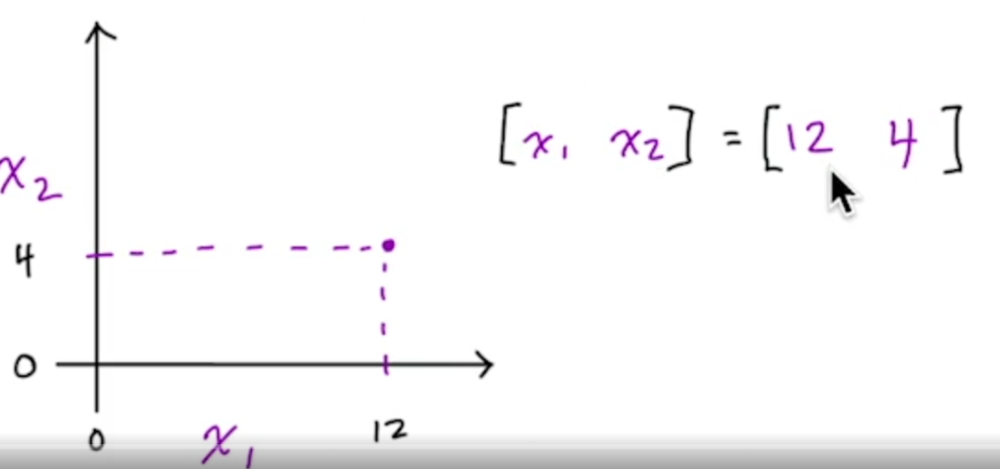

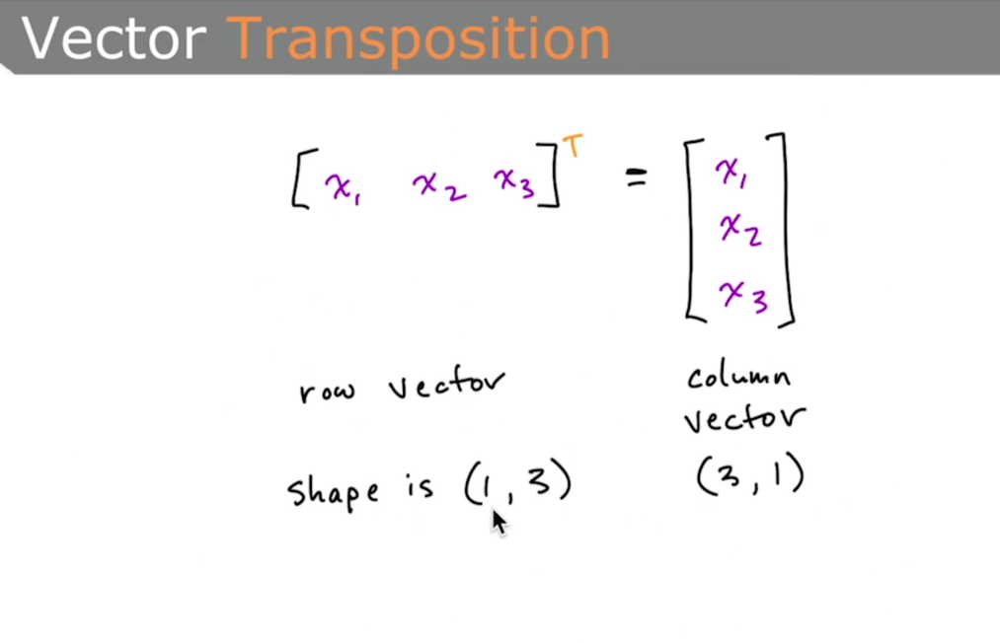

In [ ]:
 #Vectors(Rank 1 Tensors) in NumPy

import numpy as np

 x= np.array([25,2,5])#type argument is optional e.g: dtype = np.float32
 x

In [ ]:
len(x)

In [ ]:
type(x)

In [ ]:
x[0]

In [ ]:
type(x[0])

In [ ]:
#Vector Transposition
#Transposing a regular 1-D array has no effect
xt = x.T
xt

In [ ]:
xt.shape

In [ ]:
y = np.array([[25,2,5]])#double brackets can make double-dimensional "matrix-style"
y

In [ ]:
y.shape #row vector

In [ ]:
y.T #column vector

In [ ]:
#Zero vectors
#Have no effect if added to another vector
z = np.zeros(3)
z

In [ ]:
#Vectors in pytorch and tensorflow
import torch
import tensorflow as tf


xx = torch.tensor([25,2,5])
xx




In [ ]:

xx_tf = tf.Variable([25,2,5])
xx_tf

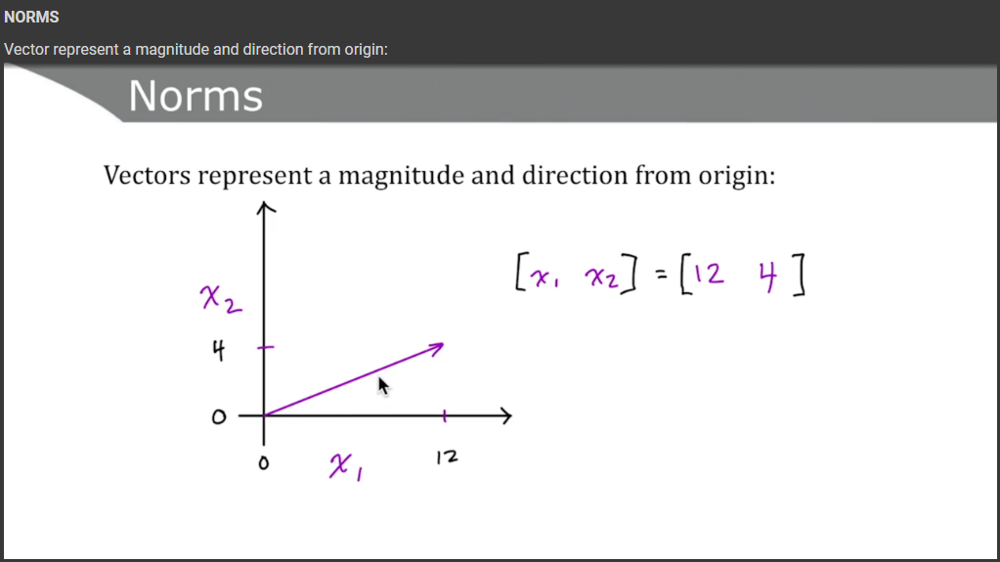

In [ ]:
#Norms are functions that quantify vector magnitude or vector length
#L² norm are the most common norm in machine learning
#The length of a vector can be calculated using the L2 norm, where the 2 is a superscript of the L, e.g. L^2.
#The notation for the L2 norm of a vector is ||v||2 where 2 is a subscript.

#notated as: l2(v) = ||v||2
#||v||2 = sqrt(a1^2 + a2^2 + a3^2)
#Measures simple(Euclidean) distance from origin

In [ ]:
x

In [ ]:
(25 ** 2 + 2**2 + 5 **2) ** (1/2) #formula

In [ ]:
#In NumPy you can calculate this expression easily by using the following command:

np.linalg.norm(x)

In [ ]:
#So, if units in this 3-dimensional vector space are meters, then the vector x has a length of 25.6m

In [ ]:
#Unit Vectors
#special case of vector where its length is equal to one
#Technically,x is a unit vector with "unit norm" ||x|| = 1



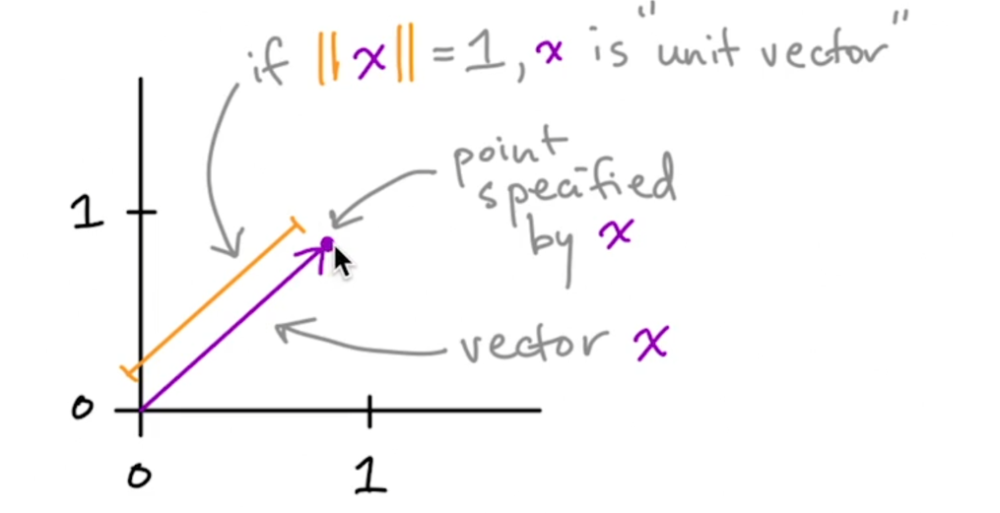

In [ ]:
"""Vector L1 Norm
The length of a vector can be calculated using the L1 norm, where the 1 is a superscript of the L, e.g. L^1.

The notation for the L1 norm of a vector is ||v||1, where 1 is a subscript. As such, this length is sometimes called the taxicab norm or the Manhattan norm."""

#l1(v) = ||v||1
#

np.abs(25)+ np.abs(2) + np.abs(5)

In [ ]:
"""Squared L² Norm"""
#The squared Euclidean norm is widely used in machine learning partly because it can be calculated with the vector operation. There can be performance gain due to optimization.

In [ ]:
(25 ** 2 + 2**2 + 5 **2) #squarred L² Norm

In [ ]:
np.dot(x,x)

In [ ]:
""" Max Norm or L infinity Norm"""
#returns the absolute value of the largest-magnitude element


In [ ]:
"""Generalized Lp Norm"""

#p must a real number,greater than or equal to one,can derive L1,l2 norm formulae by substituting for p,norms particularly L1 and l2 are used to regularize objective functions


In [ ]:
#Orthogonal Vectors
#Are at 90º angle to eatch other(assuming non-zero norms)
#n-dimensional space  has max n mutually orthogonal vector(assuming non-zero norms)
#Orthonormal vectors are orthogonal and all have unit norm
    *basis vectors are an example

In [ ]:
i = np.array([1,0])
i

In [ ]:
j = np.array([0,1])
j

MATRICES Two-dimensional array of numbers denoted in uppercase,italics,bold, eg: X Height given priority ahead of width in notation if X has three rows and two clumns,its shape is 3,2 Individual scalar elements denoted in uppercase,italics only element in topr ight coer of matrix X above would be X COLON represents an entire row or column: left column of matrix X is X1 middle row of matrix X is X2

In [ ]:
X = np.array([[25,2],[5,26],[3,7]]) #we must use double brackets, the outer bracket denotes the entire matrix,and we can use commas to separate the rows from columns, the inner bracket denotes the elements that it'll be in use

In [ ]:
X #first elements it will be first row,second row and bottom row

In [ ]:
X.shape

In [ ]:
X.size


In [ ]:
X[:,0]# slicing, select left column of matrix X

In [ ]:
X[:,1]# middle row

In [ ]:
X[0:2, 0:2]

In [ ]:
#PYTORCH

xpt = torch.tensor([[25,2],[5,26],[3,7]])
xpt

In [ ]:
xpt.shape

In [ ]:
xpt[:,1]

In [ ]:
xtf = tf.Variable([[25,2],[5,26],[3,7]])

In [ ]:
xtf

In [ ]:
#Genertic tensor notation

Upper case,bold,italics,sans serif X


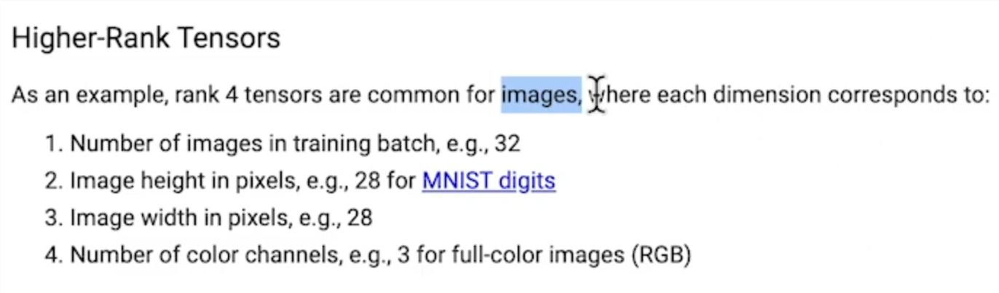

In [ ]:
import torch
import numpy
import tensorflow as tf
imagespt = torch.zeros([32,45,21,45])

In [ ]:
imagestf = tf.zeros([32,45,21,45])
imagestf

In [ ]:
x = np.array([25,2,-3,-23]) #transposition, capital T notation


In [ ]:
x.T

In [ ]:
y = np.array([[42,-99],[4,-3],[7,17],[99,22]]) #
y.shape

In [ ]:
y.size

In [ ]:
y.T #Y position 

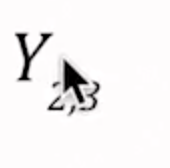

In [ ]:
#Tensor transposition

Transpose of scalar itself x.T = x
Transpose of vector,converts column to row(and vice-versa)
Scalar and vector transposition are special cases of matrix transposition[Flip of axes over main diagonal axis]

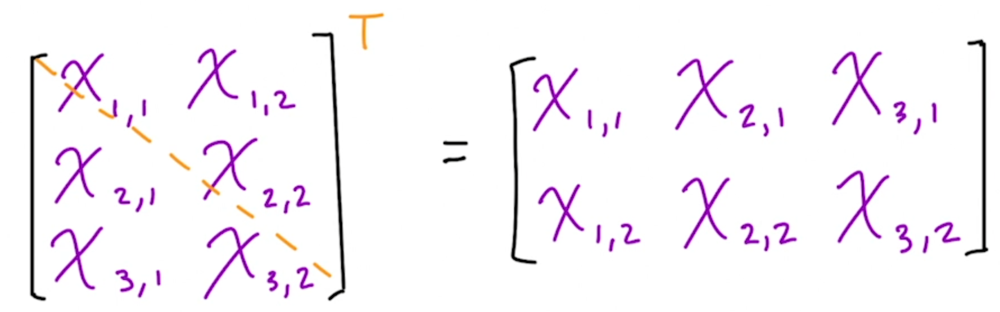

In [ ]:
#Tensor transposition

X = np.array([[25,2],[5,26],[3,7]])

In [ ]:
X.T

In [ ]:
Xtf = ([[25,2],[5,26],[3,7]]) #tensorflow
Xtf = tf.transpose(Xtf)
Xtf

In [ ]:
xpt = torch.tensor([[25,2],[5,26],[3,7]]) #pytorch
xpt

In [ ]:
X*2
X

In [ ]:
X+2
X

In [ ]:
X.T

In [ ]:
X*2+2

In [ ]:
X.shape

In [ ]:
torch.add(torch.mul(xpt,2),2)

In [ ]:
Xtf*2+2

In [ ]:
Xtf = tf.add(tf.multiply(Xtf,2),2)
Xtf

In [ ]:
""If two tensor have the same size,operations are often by defaulty applied element-wise.This is not matrix multiplication,rather is called the "HADAMARD PRODUCT" or simply "element-wise product"

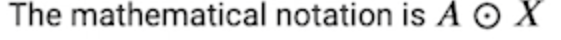

In [ ]:
A = X + 2 #Hadamard operation
A

In [ ]:
A + X

In [ ]:
A * X

In [ ]:
APT = xpt + 2
APT

In [ ]:
APT * xpt

In [ ]:
Atf = Xtf + 2
Atf

REDUCTION

Calculatin the sum across all elements of a tensor is a commmon operation.
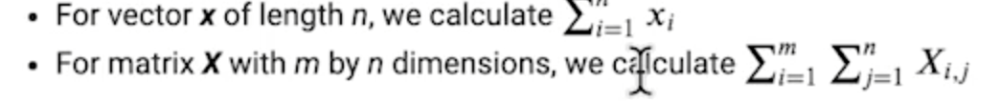

In [ ]:
X.sum()

In [ ]:
torch.sum(xpt)

In [ ]:
tf.reduce_sum(Xtf)

X.sum(axis = 0) #height takes priority 

In [ ]:
X.sum(axis = 1) #summing all columns

In [ ]:
torch.sum(xpt,0)

In [ ]:
tf.reduce_sum(Xtf,0)

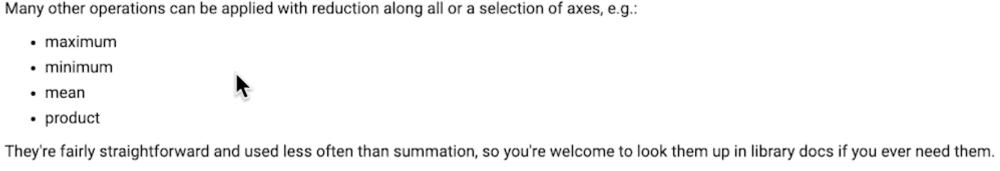

THE DOT PRODUCT

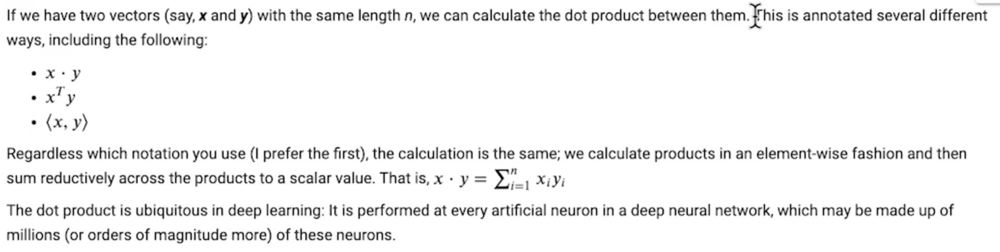

In [ ]:
x = np.array([25,2,5])

In [ ]:
y = np.array([0,1,2])
y

In [ ]:
25*0+2*1+5*2

In [ ]:
np.dot(x,y)

In [ ]:
xpt = torch.tensor([25,2,5])
ypt = torch.tensor([0,1,2])
np.dot(xpt,ypt)

In [ ]:
torch.dot(torch.tensor([25,2,5]),torch.tensor([0,1,2]))

In [ ]:
xtf = tf.Variable([25,2,5])
ytf = tf.Variable([0,1,2])

In [ ]:
tf.reduce_sum(tf.multiply(xtf,ytf))

'''''''''''''''''''

Key Concepts:
    tensor:
        scalar
        vector
        matrix
            matrix multiplication
            symmetric
            identity
        n-tensor
Transposition
Norm
Hadamard Prod
Dot product

In [ ]:
#Exercise

y = np.array([[42,-99],[4,-3],[7,17],[99,22]])

In [ ]:
y.T

In [ ]:
xc = np.array([[25,-2],[10,1]])
xv = np.array([[-1,10],[7,8]])

In [ ]:
xc.shape

In [ ]:
xc.T

In [ ]:
xc * xv

In [ ]:
w = [-1,2,-2]
s = [5,10,0]

In [ ]:
np.dot(w,s)

MATRIX MULTIPLICATION BY VECTOR
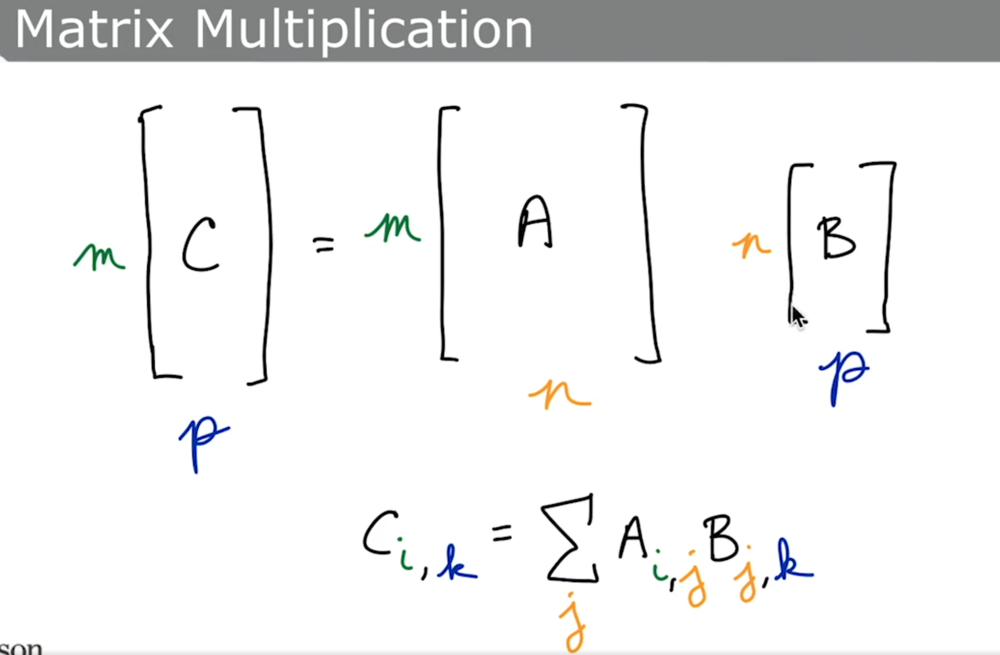

In [ ]:
xm = np.array([[3,4],[5,6],[7,8]]) #Matrix xm
xm

In [ ]:
xz = np.array([1,2]) #vector xz

In [ ]:
np.dot(xm,xz) #np.dot is also used for matrix multiplication even though is also used to do dot procuct operations

In [ ]:
xt = torch.tensor([[3,4],[5,6],[7,8]]) #Matrix xt
xt

In [ ]:
yt = torch.tensor([1,2])

In [ ]:
torch.matmul(xt,yt) #pytorch method matmul is used to calculate matrix multiplications

In [ ]:
xtf = tf.Variable([[3,4],[5,6],[7,8]])
ytf = tf.Variable([1,2])

In [ ]:
tf.linalg.matvec(xtf,ytf) #tensorflow matrix multiplication by vector

In [ ]:
'matrix by matrix multiplication'
#numpy
XM = np.array([[3,4],[5,6],[7,8]])
XZ = np.array([[1,9],[2,0]])

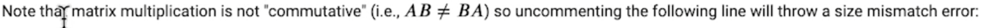

In [ ]:
np.dot(XZ,XM)

In [ ]:
TB = torch.from_numpy(XZ)  #from_numpy method conversion, MUCH MUCH CLEANER 
TA= torch.from_numpy(XM)

In [ ]:
torch.matmul(TA,TB)

In [ ]:
#Another way to create the same tensor with transposition

bpt = torch.tensor([[1,2],[9,0]]).T
bpt

In [ ]:
"tensorflow"
"convert_to_tensor method"
atf = tf.convert_to_tensor(TA,dtype=tf.int32)
btf = tf.convert_to_tensor(TB,dtype=tf.int32)

In [ ]:
tf.matmul(atf,btf)

In [ ]:
"SYMMETRIC MATRICES"

Special matrix case with following properties:
    must be a square
    X.T = X
    anything in main dialgonal can be unique
    anything off main diagonal 
    It is needed to have the elements off the main diagonal mirroring to each other

In [ ]:
X_sym = np.array([[0,1,2],[1,7,8],[2,8,9]])
X_sym

In [ ]:
X_sym.T

In [ ]:
X_sym.T == X_sym

In [ ]:
"IDENTITY MATRICES"

Symmetry matrix where:
    Every element along main diagonal is 1
    all other elements are 0
    Notation: I,n where n = height(or width)
    n-lenght vector unchanged if multiplied by I,n

In [ ]:
import numpy as np
np.eye(5)

In [ ]:
I = np.array([[1,0,0],[0,1,0],[0,0,1]])
I

In [ ]:
xp = np.array([25,2,5])
xp

In [ ]:
np.dot(I,xp) #Identity matrix multiplication

In [ ]:
#Exercise

XP = np.array([[0,1,2],[3,4,5],[6,7,8]])
XT = np.array([-1,1,-2])

In [ ]:
np.dot(XP,XT) #matrix by matrix multiplication on numpy

In [ ]:
np.dot(I,XT)# Identity matrix multiplication by vector

In [ ]:
xtf = torch.tensor([[0,1,2],[3,4,5],[6,7,8]])
ytf = torch.tensor([[-1,0],[1,1],[-2,2]])

In [ ]:
torch.matmul(xtf,ytf)

#Machine learning Application

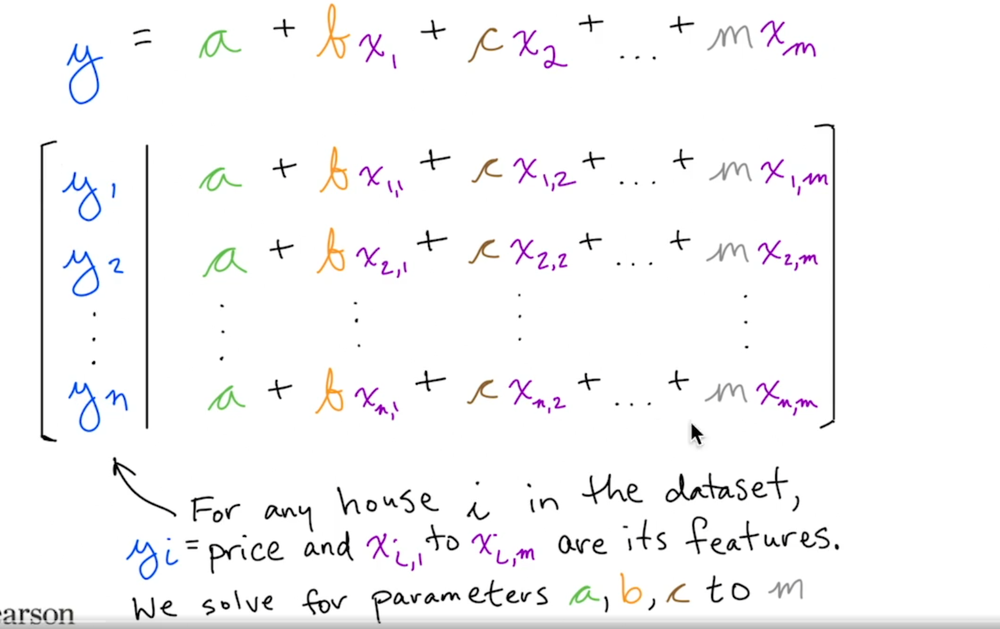

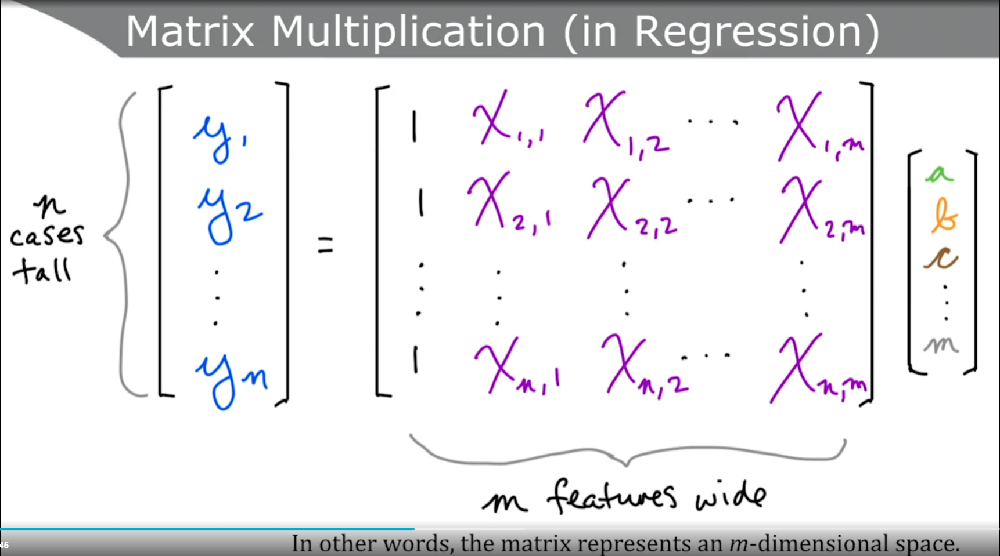

The Frobenius Norm

Analogous to L² norm of vector
Measures the size of matrix in terms of Euclidean distance
    It's the sum of the magnitude of all vectors in X
    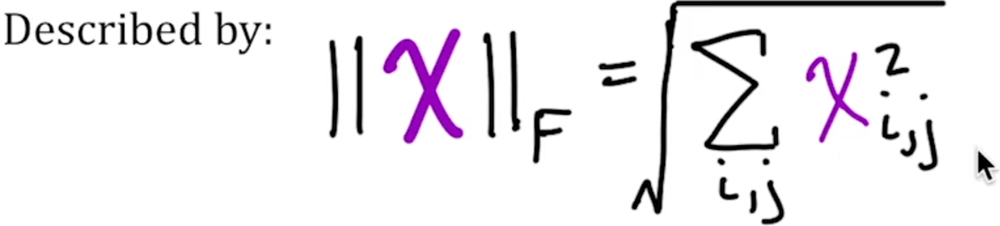

In [ ]:
!pip install torch

In [ ]:
import numpy as np
import tensorflow as tf
import torch
X = np.array([[1,2],[3,4]])
X

In [ ]:
(1**2+2**2+3**2+4**2)**(1/2)

In [ ]:
np.linalg.norm(X) #same function as for vector L2 norm

In [ ]:
Xpt = torch.tensor([[1,2],[3,4.]]) #torch.norm() supports floats only
Xpt

In [ ]:
torch.norm(Xpt)

In [ ]:
xtf = tf.Variable([[1,2],[3,4.]])
xtf

In [ ]:
tf.norm(xtf)

In [ ]:
Matrix Inversion

Clever,convenient approach for solving linear equations
An alternative to manually solving with substitution or elimination

Matrix inverse of is denoted as X-¹
    Satisfies: X-¹X=I.n

Nifty trick,but can only be calculated if:
Matrix isnt "singular"
All columns of matrix must be linearly independent
can also be calculated if:

Matrix is square n row = n col , vector span = matrix range
    avoids Overdetermination: n row > n col ie n equations > n equations
    avoids underdetermination < n row < col ie n equations < n dimensions

Solving that equation may still be possible by other means if matrix can't be inverted

In [ ]:
X = np.array([[4,2],[-5,-3]])
Xinv = np.linalg.inv(X)
Xinv

In [ ]:
y = np.array([4,-7])
y

In [ ]:
w = np.dot(Xinv,y)
w

In [ ]:
Show that y =Xw

In [ ]:
np.dot(X,w)

In [ ]:
torch.inverse(torch.tensor([[4,2],[-5,-3.]]))

In [ ]:
tf.linalg.inv(tf.Variable([[4,2],[-5,-3.]]))

In [ ]:
X = np.array([[-4,1],[-8,2]])


In [ ]:
Xinv = np.linalg.inv(X) #produces a singular matrix error, infinite number solutions matrix

DIAGONAL MATRICES

Nonzero elements along main diagonal;zeros everywhere else
Identiy matrix is an example
If square,denoted as diag(x) where x is vector of main-diagonal elements
Computationally efficient:
    multiplication:diag(x)y=x .. y
    Inversion:diag(x)-¹ = diag[1/x,...,1/X n]T
        Cant divide by zero so x cant include zero
Can be non-square and computation still efficient:
if h>w ,simply add zeros to product
if w > h,remove elements from product

Orthogonal Matrices
Orthonormal vectors:
In orthogonal matrices,orthonormal vectors:
Make up all rows
Make up all columns
This means: A T A =  AAT = I
Wich also means: AT = A-¹i = A-¹
Calculation AT is cheap,therefore so is calculation A-¹

The Trace operator
Denoted as Tr(A).Simply the sum of the diagonal elements of a matrix

The trace operator has a number of useful properties that come in handy while rearranging linear algebra equations:

*Tr(A)=Tr(AT)
*Assuming the matrix shapes line up=Tr(ABC)=Tr(CAB)=Tr(BCA)

The trace operator,can provide a convenient way to calculate matrix's Frobenius norm: ||A||f= Square root of Tr(AAT)

In [ ]:
A = np.array([[25,2],[5,4]])

In [ ]:
25 + 4

In [ ]:
np.trace(A)

In [ ]:
Ap = torch.tensor([[-1.,2.],[3.,-2.],[5.,7.]])
Ap

In [ ]:
torch.norm(Ap)

In [ ]:
torch.trace(Ap)

EIGENVECTOR and EIGENVALUES

Eigenvectors are flipped for a flipping matrix

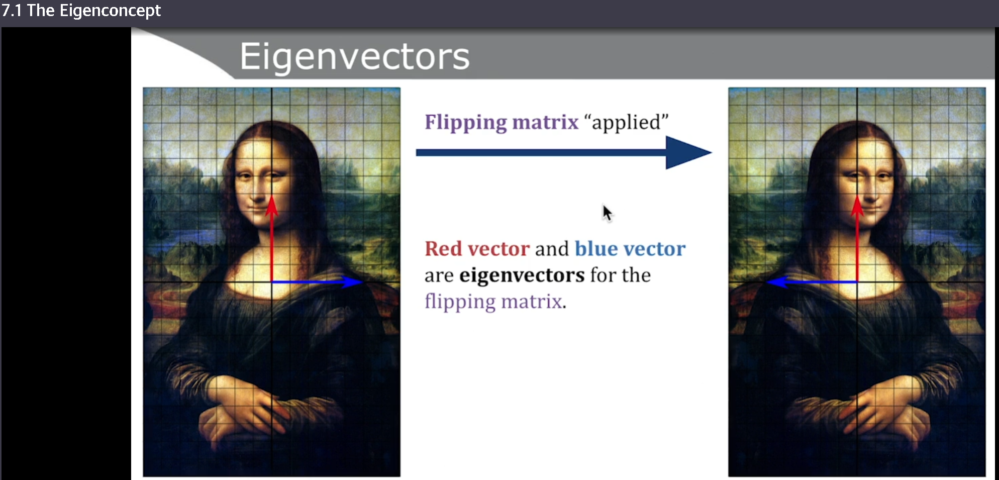

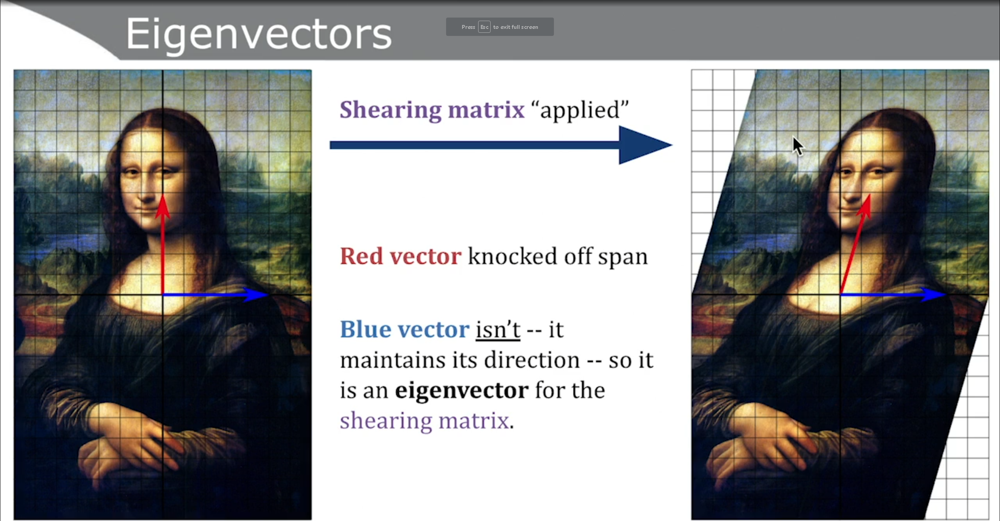

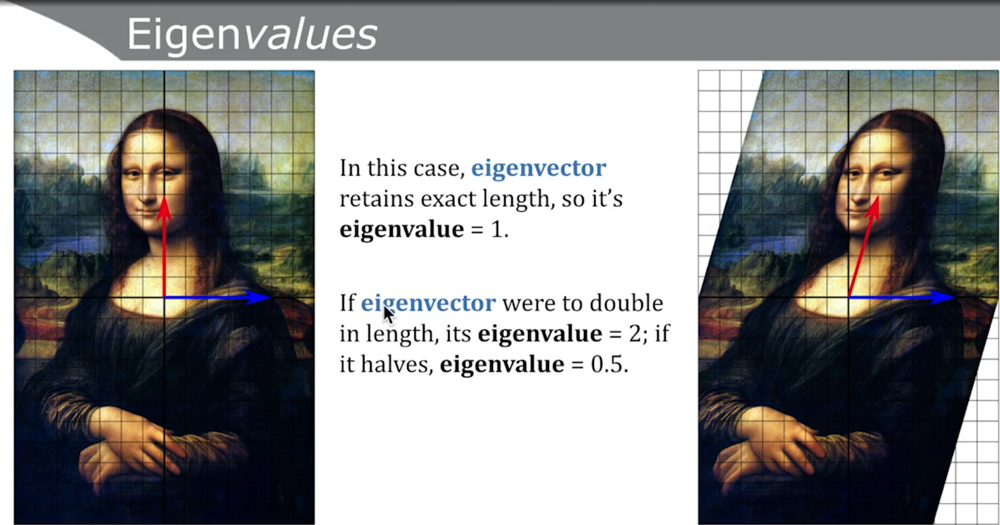

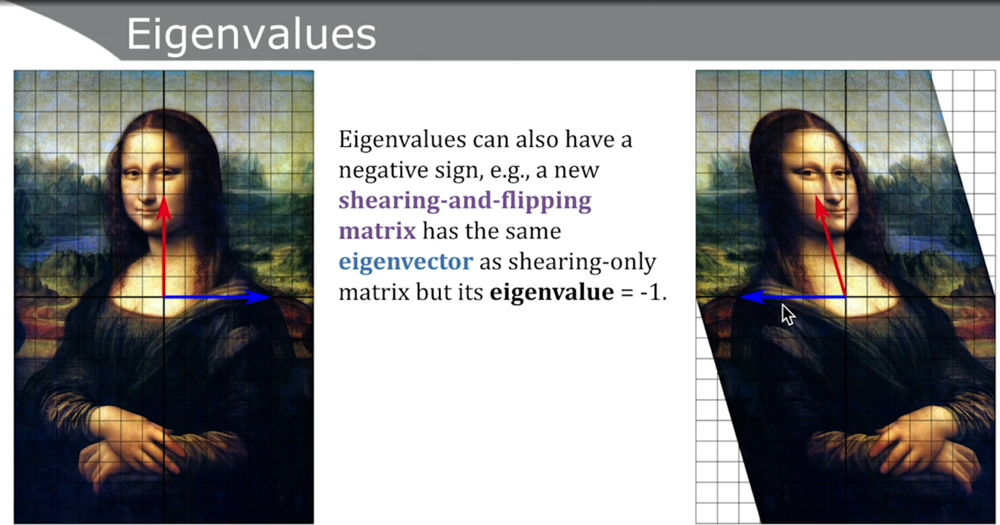

Eigenvector is a special vector v such that when its transformed by some matrix,the product Av has the exact same direction as v
Eigenvalue is a scalar value,represented by greek Lambda,simply scales the eigenvector such that following equatio is satisfied:
Av = Lambda v



In [ ]:
v = np.array([3,1])
v

In [ ]:
import matplotlib.pyplot as plt

def plotVectors(vecs,cols,alpha=1):
    """    Plot set of vectors using Hadrien Jean's handy plotVectors

    Parameters
    ----------
    vecs : array-like
        Coordinates of the vectors to plot. Each vector is in an array. For
        instance: [[1, 3], [2, 2]] can be used to plot 2 vectors.
    cols : array-like
        Colors of the vectors. For instance: ['red', 'blue'] will display the
        first vector in red and the second in blue.
    alpha : float
        Opacity of vectors

    Returns:

    fig : instance of matplotlib.figure.Figure
        The figure of the vectors"""
    
    plt.axvline(x=0, color='#A9A9A9',zorder = 0)
    plt.axhline(y=0, color='#A9A9A9',zorder = 0)

    for i in range(len(vecs)):
        x = np.concatenate([[0,0],vecs[i]])
        plt.quiver([x[0]],
                [x[1]],
                [x[2]],
                [x[3]],
                angles='xy',scale_units='xy',scale=1,color=cols[i],alpha=alpha)
            

In [ ]:
plotVectors([v],cols=['lightblue'])
_ = plt.xlim(-1,5)
_ = plt.ylim(-1,5)

"Applying a matrix to a vector(performing matrix multiplication as ie)can linearly transform the vector,eg rotate it or rescalate it"

The Identity matrix is the exception that proves the rule:Applying an identity matrix does not transform the vector

In [ ]:
Identity_Matrix = np.array([[1,0],[0,1]])
Identity_Matrix

In [ ]:
Identity_Vector = np.dot(Identity_Matrix,v) #Identity matrix doesnt transform the vector
Identity_Vector

In [ ]:
v == Identity_Vector

In [ ]:
plotVectors([Identity_Vector],cols=['blue'])
_ = plt.xlim(-1,5)
_ = plt.ylim(-1,5)

In [ ]:
A = np.array([[-1,4],[2,-2]]) #applying a non-identity matrix to the vector v
A

In [ ]:
Av = np.dot(A,v)
Av

In [ ]:
plotVectors([v,Av],cols=['lightblue','blue'])
_ = plt.xlim(-1,5)
_ = plt.ylim(-1,5)

In [ ]:
v2 =np.array([2,1])
plotVectors([v2,np.dot(A,v2)],cols=['lightgreen','green'])
_ = plt.xlim(-1,5)
_ = plt.ylim(-1,5)

In [ ]:
;We can concatenate several vectors together into a matrix(V),where each column is a separate vector.Whatever linear transformations we apply to V,will be independently applied to each column(vector)

In [ ]:
v

In [ ]:
np.matrix(v).T #recall that we need to convert array to 2D to transpose into column

In [ ]:
v3,v4 = np.array([-3,-1]),([-1,1]) #mirror image of x over both axes
v3

In [ ]:
V = np.concatenate((np.matrix(v).T,np.matrix(v2).T,np.matrix(v3).T,np.matrix(v4).T),axis=1)


In [ ]:
V

In [ ]:
AV = np.dot(A,V)
AV

In [ ]:
def vectorfy(matrix,column):
    """function to convert column of matrix to 1D vector"""
    return np.array(matrix[:,column]).reshape(-1)

In [ ]:
vectorfy(V,0) #0 means column zero

In [ ]:
vectorfy(V,1)

In [ ]:
vectorfy(V,2)

In [ ]:
vectorfy(V,3)

In [ ]:
vectorfy(V,0) == V

In [ ]:
A = np.array([[-1,4],[2,-2]])

#eig() returns a tuple of:
vector of eigenvalues
a matrix of eigenvectors

In [ ]:
lambdas,V = np.linalg.eig(A)  #eigenvectors
V

In [ ]:
lambdas #eigenvalues

In [ ]:
v = V[:,0] # Av = lambda v for the first eigenvector
v

In [ ]:
lamb = lambdas[0]
lamb

In [ ]:
Av = np.dot(A,v)
Av

In [ ]:
lamb * v

In [ ]:
plotVectors([Av,v],['blue','lightblue'])
x = plt.xlim(-1,2)
y = plt.ylim(-1,2)

In [ ]:
v2 =V[:,1]
v2

In [ ]:
lambdas2= lambdas[1]
lambdas2

In [ ]:
Av2 = np.dot(A,v2)
Av2

In [ ]:
lambdas2 * v2

In [ ]:
plotVectors([Av,v,Av2,v2],['blue','lightblue','green','lightgreen'])
x = plt.xlim(-1,4)
y = plt.ylim(-3,2)

In [ ]:
A

In [ ]:
import torch
import tensorflow as tf
ap = torch.tensor([[-1,4],[2,-2.]])
ap

torch.eig() is deprecated in favor of torch.linalg.eig() and will be removed in a future PyTorch release. torch.linalg.eig() returns complex tensors of dtype cfloat or cdouble rather than real tensors mimicking complex tensors.

L, _ = torch.eig(A) should be replaced with

L_complex = torch.linalg.eigvals(A)
L, V = torch.eig(A, eigenvectors=True) should be replaced with

L_complex, V_complex = torch.linalg.eig(A)

In [ ]:
eigens = torch.linalg.eigh(ap) # new method, torch.eig() is deprecated
eigens

In [ ]:
vp = eigens.eigenvectors[:,0]
vp

In [ ]:
lambdap = eigens.eigenvalues[0]
lambdap

In [ ]:
Av_p = torch.matmul(ap,vp)
Av_p

In [ ]:
lambdap * vp

In [ ]:
vp2 = eigens.eigenvectors[:1,]
vp2

In [ ]:
lambdap2 = eigens.eigenvalues[1]
lambdap2

In [ ]:
Av_p2 = (Av_p * vp2)
Av_p2

In [ ]:
lambdap2 * vp2

In [ ]:
plotVectors([Av_p.numpy(),vp.numpy(),Av_p2.numpy(),vp2.numpy()],['blue','lighblue','green','lightgreen'])
x = plt.xlim(-1,4)
y = plt.ylim(-3,2)

Eigenvectors in 2D

In [ ]:
X = np.array([[25,2,9],[5,26,-5],[3,7,-1]])
X

In [ ]:
lambdasx,VX = np.linalg.eig(X)

In [ ]:
VX #eigenvectors

In [ ]:
lambdasx #eigenvalues

In [ ]:
vx = VX[:,0]
vx

In [ ]:
lambdaX = lambdasx[0]
lambdaX

In [ ]:
np.dot(X,vx)

In [ ]:
lambdaX * vx

## Matrix determinants and decomposition

In [ ]:
#Map square matrix to scalar
#Enable to determine whether matrix can be inverted
#For matrix X,denoted as det(X)
#if det(X)= 0:


Matrix X-¹ cant be computed because :X has 1/det(X) =1/0
Matrix X-¹ is singular: it contains linearly-dependent columns 


In [ ]:
X = np.array([[4,2],[-5,-3]])
X

In [ ]:
np.linalg.det(X) #determinant

In [ ]:
#singular matrix

N = np.array([[-4,1],[-8,2]])
N

In [ ]:
np.linalg.det(N)

In [ ]:
ninv = np.linalg.inv(N)

In [ ]:
N = torch.tensor([[-4,1],[-8,2.]])
torch.det(N)

## The Determinants of Larger Matrices


In [ ]:
X = np.array([[1,2,4],[2,-1,3],[0,5,1]])
X

In [ ]:
np.linalg.det(X)

In [ ]:
X = np.array([[25,2],[3,4]])
X

In [ ]:
np.linalg.det(X)

In [ ]:
xinv = np.linalg.inv(X)
xinv

In [ ]:
X1 = np.array([[-2,0],[0,-2]])
X1


In [ ]:
xinv1 = np.linalg.det(X1)
xinv1

In [ ]:
xinv1 = np.linalg.inv(X1)
xinv1

In [ ]:
X2 = np.array([[2,1,-3],[4,-5,2],[0,-1,3]])
X2


In [ ]:
X2 = np.linalg.det(X2)
X2

In [ ]:
xinv2 = np.linalg.inv(X2)
xinv2

## Determinants and Eigenvalues

In [ ]:
det(X) = product of all eigenvalues of X

In [ ]:
X = np.array([[1,2,4],[2,-1,3],[0,5,1]])


In [ ]:
np.linalg.det(X)

In [ ]:
lambdas, V = np.linalg.eig(X)
lambdas

In [ ]:
V

In [ ]:
np.product(lambdas)

In [ ]:
np.abs(np.product(lambdas))

In [ ]:
b = np.array([[1,0],[0,1]])
b

In [ ]:
plotVectors([vectorfy(b,0),vectorfy(b,1)],['lightblue','blue'])
x = plt.xlim(-1,3)
y = plt.ylim(-1,3)

In [ ]:
N

In [ ]:
np.linalg.det(N)

In [ ]:
nb = np.dot(N,b)
nb

In [ ]:
plotVectors([vectorfy(b,0),vectorfy(b,1),vectorfy(nb,0),vectorfy(nb,1)],['lightblue','blue','green','blue'])
x = plt.xlim(-4,2)
y = plt.ylim(-9,2)

In [ ]:
I = np.array([[1,0],[0,1]])
I

In [ ]:
np.linalg.det(I)

In [ ]:
ib = np.dot(I,b)
ib

In [ ]:
plotVectors([vectorfy(b,0),vectorfy(b,1),vectorfy(ib,0),vectorfy(ib,1)],['lightblue','blue','green','blue'])
x = plt.xlim(-1,3)
y = plt.ylim(-1,3)

## Eigendecomposition

The decomposition of a matrix into eigenvectors and eigenvalues relveals characteristics of the matrix:
    - Matrix is singular if and only if any of its eigenvalues are zero
    Uder specific conditions can optimize quadratic expressions:
        -   Maximum of f(x) = largest eigenvalue
            Miminum of f(x) = smallets eigenvalue


Let A be a square n × n matrix with n linearly independent eigenvectors qi (where i = 1, ..., n). Then A can be factorized as

{\displaystyle \mathbf {A} =\mathbf {Q} \mathbf {\Lambda } \mathbf {Q} ^{-1}}\mathbf{A}=\mathbf{Q}\mathbf{\Lambda}\mathbf{Q}^{-1}  

where Q is the square n × n matrix whose ith column is the eigenvector qi of A, and Λ is the diagonal matrix whose diagonal elements are the corresponding eigenvalues, Λii = λi. Note that only diagonalizable matrices can be factorized in this way. For example, the defective matrix  (which is a shear matrix) cannot be diagonalized.

The n eigenvectors qi are usually normalized, but they need not be. A non-normalized set of n eigenvectors, vi can also be used as the columns of Q. That can be understood by noting that the magnitude of the eigenvectors in Q gets canceled in the decomposition by the presence of Q−1. If one of the eigenvalues λi has more than one linearly independent eigenvectors (that is, the geometric multiplicity of λi is greater than 1), then these eigenvectors for this eigenvalue λi can be chosen to be mutually orthogonal; However, if two eigenvectors belong to two different eigenvalues, it may be impossible for them to be orthogonal to each other (see Example below). One special case is that if A is a normal matrix, then by the spectral theorem, it's always possible to diagonalize A in an orthonormal basis {qi}.

In [ ]:
import numpy as np
import torch
A = np.array([[4,2],[-5,-3]])
A

In [ ]:
lambdas, V = np.linalg.eig(A)
lambdas

In [ ]:
Vinv = np.linalg.inv(V)
Vinv

In [ ]:
Lambda = np.diag(lambdas)
Lambda

In [ ]:
np.dot(V,np.dot(Lambda,Vinv))


Eigendecomposition is not possible with all matrices.And in some cases where it is possible,the eigendecomposition involves complex numbers instead of straightforward real numbers

If A is a real symmetric matrix then

A = QΛQT
where Q is analogous to V from the previous equation except that is special because of its an orthogonal matrix

In [ ]:
A = np.array([[2,1],[1,2]])
A

In [ ]:
lambdas,Q =np.linalg.eig(A)
lambdas

In [ ]:
Lambda = np.diag(lambdas)
Lambda

In [ ]:
Q

Recalling that QTQ = QQT = I  can demonstrate that Q is an orthogonal matrix

In [ ]:
np.dot(Q.T,Q)

In [ ]:
np.dot(Q,Q.T)

Confirming A=QΛQT:

In [ ]:
np.dot(Q,np.dot(Lambda,Q.T))

In [ ]:
Identity_Vector.T

In [ ]:
Identity_Vector.shape

In [ ]:
Identity_Vector.size

In [ ]:
Identity_Vector.std

In [ ]:
Identity_Vector.mean

In [ ]:
Identity_Vector.mean(axis=0)

In [ ]:
Identity_Vector= np.dot(Identity_Vector,V)
Identity_Vector

In [ ]:
plotVectors([v,v2,v3,v4],cols=['lightgreen','green','red','lightblue']) #TROMBA VERSION
_ = plt.xlim(-5,5)
_ = plt.ylim(-3,5)

## Singular Value Decomposition

SVD is applicable to any real-valued matrix
SVD of matrix A is:

A = U DVT

U is an orthogonal m X m matrix; its columns are left-singular vectors of A
V is an orthogonal n X n matrix;its colums are right-singular vectors of A
D is a diagonal m X m matrix; elements along its diagonal are the singular values of A




In [ ]:
import numpy as np
import torch
import tensorflow as tf

A =  np.array([[-1,2],[3,-2],[5,7]])

In [ ]:
U,d,VT = np.linalg.svd(A) # V is already transposed; svd method

In [ ]:
U

In [ ]:
VT

In [ ]:
d

In [ ]:
np.diag(d) #diag method

In [ ]:
D = np.concatenate((np.diag(d),[[0,0]]),axis=0)
D

In [ ]:
np.dot(U,np.dot(D,VT))

In [ ]:
SVD and eigendecomposition are closely related to each other:

Left-singular vectors of A = eigenvectors of AAt 
Right sinular vectors of A = eigenvectors of At A
Non-zero singular values of A = square roots of eigenvectors of AAt = square roots of eigenvectors of At A

In [ ]:
#Image compression via SVD
import matplotlib.pyplot as plt
import requests
import time
from PIL import Image
import shutil

img = ('https://raw.githubusercontent.com/jonkrohn/DLTFpT/master/notebooks/oboe-with-book.jpg')
r = requests.get(img,stream = True)
filename = img.split("/")[-1]

print(img)

In [ ]:
with open(filename,'wb')as f:
    shutil.copyfileobj(r.raw,f)

In [ ]:
print(filename)

In [ ]:
import wget

imgurl = "https://raw.githubusercontent.com/jonkrohn/DLTFpT/master/notebooks/oboe-with-book.jpg"
imgfilename = wget.download(imgurl)
print(imgfilename)

In [ ]:
imagem = Image.open('oboe-with-book.jpg')
plt.imshow(imagem)

In [ ]:
image_gray = imagem.convert('RGBA')
plt.imshow(image_gray)

In [ ]:
imgmat = np.array(list(image_gray.getdata(band=0)),float)
imgmat.shape = (image_gray.size[1],image_gray.size[0])
imgmat = np.matrix(imgmat)
plt.imshow(imgmat,cmap='gray')

In [ ]:
U,sigma,V = np.linalg.svd(imgmat)

As eigenvalues are arranged in descending order in diag(lambda) so to are singular values,by convention,arranged in descending order in D(or in this code,diag(sigma)).
Thus the first lef-singular vector of U and first right-singular value of V may represent the most prominent feature of the image:

In [ ]:
reconstructing_image = np.matrix(U[:, :1]) * np.diag(sigma[:1]) * np.matrix(V[:1,:])
plt.imshow(reconstructing_image,cmap='gray')

In [ ]:
for i in [2,4,8,16,32,64]:
    reconstructing_image = np.matrix(U[:, :i]) * np.diag(sigma[:i]) * np.matrix(V[:i,:])
    plt.imshow(reconstructing_image,cmap='gray')
    title = "n = %s" % i 
    plt.title(title)
    plt.show()

Data footprint:

In [ ]:
imgmat.shape

In [ ]:
full_representation = 4032*3024
full_representation

In [ ]:
svd64_rep = 64*4032 + 64 + 64*3024
svd64_rep

In [ ]:
svd64_rep / full_representation # that means the svd image has only 3.7% of the size of the original

## 9.3 The Moore-Penrose Pseudoinverse


In [ ]:
#such an other mean when matrix cant be inverted
#For some matrix A,its pseudoinverse A+ can be computed by:

A+ = VD+UT

Where:
-U,D and V are SVD of A
D+ = (D with reciprocal of all non-zero elements)T

In [ ]:
A

In [ ]:
U,d,VT = np.linalg.svd(A)

In [ ]:
U

In [ ]:
d

In [ ]:
VT

In [ ]:
#to create D+ ,first invert the non-zero values of d:

D = np.diag(d)
D

In [ ]:
1/8.669

In [ ]:
1/4.104

In [ ]:
#tranpose the matrix
#inverting D

In [ ]:
dinv = np.linalg.inv(D)
dinv

In [ ]:
#changing the shape for matrix multiplication in the A+ = VD+UT

In [ ]:
A.shape[0]


In [ ]:
A.shape[1]

In [ ]:
Dplus = np.zeros((3,2)).T
Dplus

In [ ]:
Dplus[:2, :2] = dinv
Dplus

In [ ]:
#calculating everything ,A+ with VD+UT

In [ ]:
np.dot(VT.T,np.dot(Dplus,U.T)) #pseudoinverse of A

In [ ]:
np.linalg.pinv(A)

In [ ]:
torcharray = torch.tensor([[-1,2],[3,-2],[5,7.]])
torcharray

In [ ]:
torch.pinverse(torcharray)

In [ ]:
#REGRESSION MODEL

x1 = [0,1,2,3,4,5,6,7,8,9.] #exemplo: dosage of drug for treating Alzheimers decease
y = [1.86,1.50,2.1,.50,.60,.09,-.69,-1.51,-1.03,-1.96] #Patients forgetfulness score

title = 'Clinical Trial'
xlabel = 'Drug dosage (mL)'
ylabel = 'Forgetfulness'

fig,ax = plt.subplots()
plt.title(title)
plt.xlabel(xlabel)
plt.ylabel(ylabel)
x = ax.scatter(x1,y)

In [ ]:
x0 = np.ones(10)
x0

In [ ]:
X = np.concatenate((np.matrix(x0).T, np.matrix(x1).T),axis=1)
X

In [ ]:
#compute the weight of w using the pseudoinverse of w = X+y:
w = np.dot(np.linalg.pinv(X),y)
w

In [ ]:
#first weight corresponds to the y-intercept of the line,denoted as b
b = np.asarray(w).reshape(-1)[0]
b

In [ ]:
m = np.asarray(w).reshape(-1)[1]
m

In [ ]:
fig,ax = plt.subplots()

plt.title(title)
plt.xlabel(xlabel)
plt.ylabel(ylabel)

ax.scatter(x1,y)

x_min,x_max = ax.get_xlim()
y_min,y_max = m*x_min + b, m*x_max + b

ax.set_xlim([x_min,x_max])
_ = ax.plot([x_min,x_max],[y_min,y_max])


## Principal Component Analysis

Unsupervised:enables identification of structure in unlabeled data
Simple machine learning algorithm
Enables lossy compression


In [ ]:
#PCA example code

from sklearn import datasets
from sklearn.decomposition import PCA
iris = datasets.load_iris()

iris.data.shape #150 flowers and 4 measurements of these flowers

In [ ]:
iris.get("feature_names")

In [ ]:
iris.data[0:6,:] #petal and sepal measurements

In [ ]:
pca = PCA(n_components=2)

In [ ]:
X = pca.fit_transform(iris.data)

In [ ]:
X.shape

In [ ]:
X[0:6,:]

In [ ]:
plt.scatter(X[:,0],X[:,1])

In [ ]:
iris.target.shape

In [ ]:
iris.target[0:6]

In [ ]:
unique_elements,counts_elements = np.unique(iris.target,return_counts=True)
np.asarray((unique_elements,counts_elements))

In [ ]:
list(iris.target_names)

In [ ]:
plt.scatter(X[:,0],X[:,1],c=iris.target)

## CALCULUS!

Differential versus Integral Calculus

In [ ]:
Mathematical study of continunous

Two branches:
Differential calculus -> focus of Calculus I
Integral calculus -> focus of Calculus II class
Study of rates of change 

Calculus of the Infinitesimals

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

x = np.linspace(-10,10,1000) #starting point, finishing point, n points

If y = x² + 2x +2:

In [ ]:
y = x**2 + 2*x + 2
fig,ax = plt.subplots()
_ = ax.plot(x,y)

There are no straight lines on the curve
zooming into infinitely close,it is possible to observe curves that approach lines
this enables to find slope m(tangent) anywhere on the curve,including to identify where m = 0:

In [ ]:
fig,ax = plt.subplots()
ax.set_xlim([-2,-0])
ax.set_ylim(0,2)
plot = ax.plot(x,y)

In [ ]:
fig,ax = plt.subplots()
ax.set_xlim([-1.5,-0.5])
ax.set_ylim(0.5,1.5)
plot = ax.plot(x,y)

In [ ]:
fig,ax = plt.subplots()
ax.set_xlim([-1.1,-0.9])
ax.set_ylim(0.9,1.1)
plot = ax.plot(x,y)

In [ ]:
fig,ax = plt.subplots()
ax.set_xlim([-1.01,-0.99])
ax.set_ylim(0.99,1.01)
plot = ax.plot(x,y)

## Limits

Trivially easy to calculate for a continuous function

In [ ]:
![](2022-07-12-12-19-50.png)

In [ ]:
fig,ax = plt.subplots()
plt.axvline(x=0,color='lightgray')
plt.axhline(y=0,color='lightgray')
plt.xlim(-5,10)
plt.ylim(-10,80)
plt.axvline(x=5,color='purple',linestyle='--')
plt.axhline(y=37,color='purple',linestyle='--')
z = ax.plot(x,y)


![](2022-07-12-12-29-30.png)

In [ ]:
#factoring by algebra
def fxn(x1):
    y1 = (x1**2-1) / (x1 -1)
    return y1

In [ ]:
fxn(1)

In [ ]:
fxn(0.9)

In [ ]:
fxn(0.999)

In [ ]:
fxn(1.1)

In [ ]:
fxn(1.001)

In [ ]:
y1 = fxn(x)

In [ ]:
fig,ax = plt.subplots()
plt.axvline(x=0,color='lightgray')
plt.axhline(y=0,color='lightgray')
plt.xlim(-1,5)
plt.ylim(-1,5)
plt.axvline(x=1,color='purple',linestyle='--')
plt.axhline(y=2,color='purple',linestyle='--')
z = ax.plot(x,y)


In [ ]:
2022-07-12-12-34-35.png

In [ ]:
2022-07-12-12-38-01.png

In [ ]:
#sin function
#approachin method


def sin_fxn(myx):
    myy = np.sin(myx) /myx
    return myy

In [ ]:
y = sin_fxn(0)

In [ ]:
sin_fxn(0.1)

In [ ]:
sin_fxn(0.001)

In [ ]:
sin_fxn(-0.1)

In [ ]:
sin_fxn(-0.1111)

In [ ]:
y = sin_fxn(x)

In [ ]:
fig,ax = plt.subplots()
plt.axvline(x=0,color='lightgray')
plt.axhline(y=0,color='lightgray')
plt.xlim(-10,10)
plt.ylim(-1,2)
plt.axvline(x=0,color='purple',linestyle='--')
plt.axhline(y=1,color='purple',linestyle='--')
z = ax.plot(x,y)

## Approaching Infinity

In [ ]:
2022-07-12-12-45-53.png

In [ ]:
x = np.linspace(-10,10,1000)

def inf(my_x):
    my_y = 25/my_x
    return my_y

In [ ]:
y = inf(x)

In [ ]:
inf(1e3) # 1 times 10 to the power of 3,  1 * 10 ** 3

In [ ]:
1 * 10 ** 3

In [ ]:
inf(1e6)

In [ ]:
1 * 10 ** 6

In [ ]:
fig,ax = plt.subplots()
plt.axvline(x=0,color='lightgray')
plt.axhline(y=0,color='lightgray')
plt.xlim(-10,10)
plt.ylim(-300,300)
z = ax.plot(x,y)

##  Delta Method

In [ ]:
2022-07-12-13-37-27.png

If y = x² + 2x +2:

In [ ]:
def func(my_x):
    my_y = my_x **2 + 2 *my_x + 2
    return my_y

    If y = x² + 2x +2:

In [ ]:
y = func(x)

In [ ]:
fig,ax = plt.subplots()
plt.axvline(x=0,color='lightgray')
plt.axhline(y=0,color='lightgray')
zz = ax.plot(x,y)

In [ ]:
#   x = 2

func(2) # determining where is y

In [ ]:
fig,ax = plt.subplots()
plt.axvline(x=0,color='lightgray')
plt.axhline(y=0,color='lightgray')
plt.scatter(2,10)  #scatters plots a point placed on the axline
zz = ax.plot(x,y)

The delta method uses the differecen between two points to calculate slope. If x = 5

In [ ]:
func(5)

In [ ]:
fig,ax = plt.subplots()
plt.axvline(x=0,color='lightgray')
plt.axhline(y=0,color='lightgray')
plt.scatter(2,10)
plt.scatter(5,37)   #scatters plots a point placed on the axline
zz = ax.plot(x,y)

2022-07-12-13-50-21.png

In [ ]:
m = (37-10)/(5-2)
m

2022-07-12-13-52-07.png

In [ ]:
b = 37-m*5
b

In [ ]:
liney=m*x+b
liney

In [ ]:
fig,ax = plt.subplots()
plt.axvline(x=0,color='lightgray')
plt.axhline(y=0,color='lightgray')
plt.scatter(2,10)
plt.scatter(5,37)   #scatters plots a point placed on the axline
plt.ylim(-5,150)
plt.plot(x,liney, c='orange')
zz = ax.plot(x,y)

In [ ]:
func(2.1)

In [ ]:
fig,ax = plt.subplots()
plt.axvline(x=0,color='lightgray')
plt.axhline(y=0,color='lightgray')
plt.scatter(2,10)
plt.scatter(2.1,10.61)   #scatters plots a point placed on the axline
plt.ylim(-5,150)
plt.plot(x,liney, c='orange')
zz = ax.plot(x,y)

In [ ]:
m=(10.61-10)/(2.1-2)
b = 10.61-m*2.1
liney=m*x+b

fig,ax = plt.subplots()
plt.axvline(x=0,color='lightgray')
plt.axhline(y=0,color='lightgray')
plt.scatter(2,10)
plt.scatter(2.1,10.61)   #scatters plots a point placed on the axline
plt.ylim(-5,150)
plt.plot(x,liney, c='orange')
zz = ax.plot(x,y)

In [ ]:
deltax = 0.000001
x1=2
y1=10
deltax
x2=x1+deltax
x2

In [ ]:
y2=func(x2)
y2


In [ ]:
m=(y2-y1)/(x2-x1)
m

In [ ]:
#Para achar qualquer declive de uma tangente onde o valor seja x = <qualquer valor> use:

# Equação --> y = x² + 2x +2:

def func(my_x):
    my_y = my_x **2 + 2 *my_x + 2
    return my_y

#inicie definindo x

x1 = -1 #Para o ponto P

#defina y
y1 = func(x1) # = 1

#Ponto P achado em (-1,1)
delta_x = (1e06)
delta_x

![](2022-08-02-10-19-03.png)

In [ ]:
def diff(myf,myx,mydelta):
    return (myf(myx + mydelta)- myf(myx)) / mydelta #same formulas as pictured above

In [ ]:
deltas = [1,0.1,0.01,0.001,0.0001,0.00001,0.000001]

In [ ]:
for delta in deltas:
    print(diff(myf,2,delta))

![](2022-08-02-10-28-11.png)

## Automatic Differentiation

#called as autodiff or autograd
    *Computational diff
    *Reverse mode diff
    *Algorithmic diff

Distinct from diff
from classical methods:
    Numerical diff
    Symbolic diff 

Relative to classical methods:
    Functions with many InputSource
    High-order derivatives

Application of chain rule(typically partial derivatives) to sequence(forward pass)of arithmetic operations
Whereas chain rule by hand typicall begins at most-nested function autodfic proceeds from outermost function inward
Small constant factor more compute than forwards pass(at most)

In [ ]:
Autodiff with pytorch 

Tensor flow and Pytorch are the two most popular automatic differentiation libraries

Calculate dy/dx at x = 5 where:

    y = x²
    dy/dx = 2x = 2(5)=10
    


In [ ]:
x = torch.tensor(5.0)
x

In [ ]:
x.requires_grad_() #contagiously track gradients through forward pass

In [ ]:
y = x**2
y

In [ ]:
y.backward()#use autodiff
y

In [ ]:
x.grad

In [ ]:
#Autodiff with tensorflow

import tensorflow as tf
x =  tf.Variable(5.0)
with tf.GradientTape() as t:
    t.watch(x)#track forward pass
    y = x**2

In [ ]:
t.gradient(y,x)

In [ ]:
Line equation y = mx + b as direct acyclic graph(DAG)
nodes are input,output,paramters or operations
directed edges ('arrows') are tensors

In [ ]:
import torch
import matplotlib.pyplot as plt

x  = torch.tensor([0,1,2,3,4,5,6,7.])
x

In [ ]:
#the y values were created using the equation of a line = y = mx + b. We know the model paramters to be learned,are,say m = -05 and b=2.Random normally-distribuited noise has been added simulate sampling error:
#y = -0.5*x+2+torch.normal(mean=torch.zeros(8),std=0.2)

In [ ]:
y = torch.tensor([1.86,1.31,.62,.33,.09,-.65,-1.23,-1.37])

In [ ]:
fig,ax = plt.subplots()
plt.title("Clinical Trial")
plt.xlabel("Drug dosage trial(mL)")
plt.ylabel("Forgetfulness")
_=ax.scatter(x,y)

In [ ]:
m =  torch.tensor([0.9])
m

In [ ]:
b = torch.tensor([0.1])
b

In [ ]:
def regression_plot(xx,yy,mm,bb):
    fig,ax = plt.subplots()

    ax.scatter(xx,yy)
    
    xmin,xmax = ax.get_xlim()
    ymin,ymax = mm*xmin + bb, mm*xmax + bb

    ax.set_xlim([xmin,xmax])
    z = ax.plot([xmin,xmax],[ymin,ymax])

In [ ]:
regression_plot(x,y,m,b)

In [ ]:
def regression(xx,mm,bb):
    return xx*mm+bb

In [ ]:
#Automatic Differentiation in pytorch

import torch

x = torch.tensor(0.).requires_grad_()
x

In [ ]:
y = torch.tensor(0.).requires_grad_()
y


In [ ]:
z = f(x,y)
z

## Fitting a Line with Machine Learning

![](2022-08-30-13-09-44.png)

In [ ]:
yhat = regression(x,m,b)
yhat

In [ ]:
def mse(yhat1,myy):
    """Mean Square loss function""" # C= 1/n sum**n i =1 (^yi - yi)²
    sigma = torch.sum((yhat1 - myy)**2)
    return sigma / len(myy)

In [ ]:
C = mse(yhat,y)
C

In [ ]:
C.backward()
C

In [ ]:
m.grad
m

In [ ]:
b.grad
b

gradient descent

In [ ]:
optimizer = torch.optim.SGD([m,b],lr=0.01)
optimizer

In [ ]:
optimizer.step()

In [ ]:
optimizer

In [ ]:
m

In [ ]:
b

In [ ]:
regression_plot(x,y,m,b)

In [ ]:
C = mse(regression(x,m,b),y)
C

In [ ]:
epochs = 1000
for epoch in range(epochs):

    optimizer.zero_grad()
    yhat = regression(x,m,b)
    C=mse(yhat,y)
    C.backward()
    optimizer.step()
    print('Epoch{} cost {} m grad {} b grad {}'.format(epoch,'%.3g' % C.item(), '%.3g' % m.grad.item(), '%.3g'))

### PARTIAL DERIVATIVES

In [ ]:
#consider de equation z = x² - y²

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import math

Define a function f(x,y) for z = x²-y²:

In [4]:
def f(myx,myy):
    return myx**2 - myy**2

plot z with respect to x by varying x


In [5]:
xs = np.linspace(-3,3,1000)

while holdidng y constant

In [6]:
zswrtx = f(xs,0)

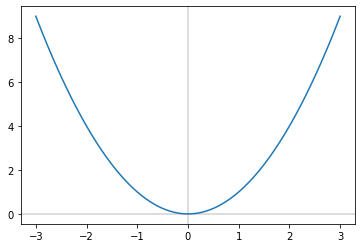

In [7]:
fig,ax=plt.subplots()
plt.axvline(x=0,color='lightgray')
plt.axhline(y=0,color='lightgray')
a=ax.plot(xs,zswrtx)

to determine the slope of zrtwx at a given point along the curve,we can use the partial derivative: dz / dx =2x

In [8]:
def delz_delx(myx,my):
    return 2*myx

In [9]:
xsamples = [-2,-1,0,1,2]

In [10]:
colors = ['red','orange','green','blue','purple']

In [11]:
def point_and_tangent_wrtx(mysx,myx,myy,myf,fprime,col):
    myz = myf(myx,myy)
    plt.scatter(myx,myz,c=col)

    tangent_m = fprime(myx,myy)
    tangent_b = myz - tangent_m*myx
    tangent_line = tangent_m*mysx + tangent_b

    plt.plot(mysx,tangent_line,c=col,linestyle='dashed',linewidth=0.7)

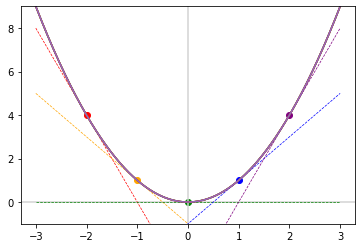

In [12]:
fig,ax = plt.subplots()
plt.axvline(x=0,color='lightgray')
plt.axhline(y=0,color='lightgray')

for i,x in enumerate(xsamples):
    point_and_tangent_wrtx(xs,x,0,f,delz_delx,colors[i])

    plt.ylim(-1,9)
    h=ax.plot(xs,zswrtx)

plot z with respect to y by varying y


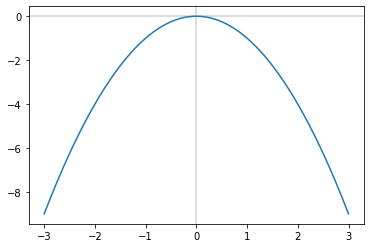

In [13]:
ys = np.linspace(-3,3,1000)
zswrty = f(0,ys)#holding x constant ,eg at x = 0
fig,ax=plt.subplots()
plt.axvline(x=0,color='lightgray')
plt.axhline(y=0,color='lightgray')
a=ax.plot(ys,zswrty)


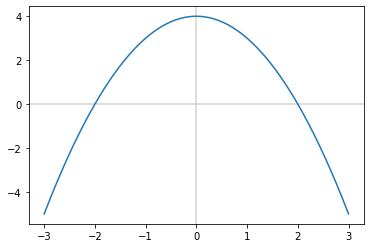

In [14]:
zswrty = f(2,ys)#example of holding x constant at 2 increases z,but has no impact on the slope of z wrt y
fig,ax=plt.subplots()
plt.axvline(x=0,color='lightgray')
plt.axhline(y=0,color='lightgray')
a=ax.plot(ys,zswrty)


In [15]:
def delz_dely(myx,my):
    return -2*my

In [16]:
ysamples = [-2,-1,0,1,2]

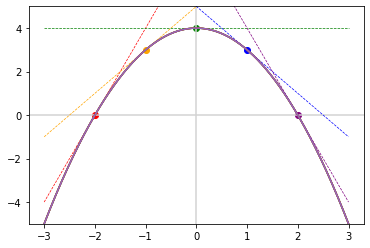

In [17]:
def point_and_tangent_wrty(mysy,myx,myy,myf,fprime,col):
    myz = myf(myx,myy)
    plt.scatter(myy,myz,c=col)

    tangent_m = fprime(myx,myy)
    tangent_b = myz - tangent_m*myy
    tangent_line = tangent_m*mysy + tangent_b

    plt.plot(mysy,tangent_line,c=col,linestyle='dashed',linewidth=0.7)

fig,ax = plt.subplots()
plt.axvline(x=0,color='lightgray')
plt.axhline(y=0,color='lightgray')

for i,y in enumerate(xsamples):
    point_and_tangent_wrty(ys,2,y,f,delz_dely,colors[i])

    plt.ylim(-5,5)
    h=ax.plot(xs,zswrty)


In [25]:
x = torch.tensor(3.).requires_grad_()
x

tensor(3., requires_grad=True)

In [26]:
y = torch.tensor(0.).requires_grad_()
y

tensor(0., requires_grad=True)

In [27]:
z = f(x,y) #forward pass
z

tensor(9., grad_fn=<SubBackward0>)

In [28]:
z.backward() #autodiff

In [29]:
x.grad

tensor(6.)

In [30]:
y.grad

tensor(-0.)

In [31]:
!pip install pymysql

     ---------------------------------------- 43.8/43.8 kB 2.1 MB/s eta 0:00:00

[notice] A new release of pip available: 22.1.2 -> 22.2.2
[notice] To update, run: C:\Users\thefa\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


### Geometrical Examples

In [ ]:
"""
The Volume of a cylinder is described by v = pir² where:
r is the radius of the cylinder
l is the lenght

"""

In [9]:
import torch 
import math

def cylinder_Vol(r,l):
    return math.pi * r ** 2 * l

R = torch.tensor(3.).requires_grad_()
R

tensor(3., requires_grad=True)

In [7]:
L = torch.tensor(5.).requires_grad_()
L

tensor(5., requires_grad=True)

In [10]:
v = cylinder_Vol(R,L)
v

tensor(141.3717, grad_fn=<MulBackward0>)

In [11]:
v.backward()

In [12]:
L.grad #lenght of the cylinder 

tensor(28.2743)

In [ ]:
' For changes in v with respect to r,the following formula applies:

    dv = 2prl
    dr
'

In [13]:
R.grad

tensor(94.2478)

In [14]:
2 * math.pi * 3 * 5

94.24777960769379

In [15]:
delta = 1e-6 #infinitesimally small delta

In [20]:
(cylinder_Vol(3 + delta,5) - cylinder_Vol(3,5)) / delta

94.24779531741478

# Chail rule for partial derivatives

![](2022-09-06-12-38-10.png)

![](2022-09-06-12-38-35.png)

![](2022-09-06-12-40-10.png)

![](2022-09-06-12-45-07.png)

# GRADIENTS

Single-Point Regression

In [ ]:
#Calculations of quadratic cost with respect to a straight line regression models parameters. Partial derivatives will be used by limiting the model to a single data point

In [1]:
xs = torch.tensor([0,1,2,3,4,5,6,7.])
ys = torch.tensor([1.86,1.31,.62,.33,.09,-.67,-1.23,-1.37])

NameError: name 'torch' is not defined

In [23]:
#The slope of a line is given by y=mx + b

def regression(x,m,b):
    return x*m+b

In [31]:
#  m and b with the same randon near-zero values

M = torch.tensor([0.9]).requires_grad_()
B = torch.tensor([0.1]).requires_grad_()

In [28]:
i = 7
X = xs[i]
Y = ys[i]

In [29]:
X #data points

tensor(7.)

In [30]:
Y #data points

tensor(-1.3700)

In [ ]:
# step1 : Forward pass

Flow the scalar tensor x through the regression model to produce ^y, an estimate of y


In [34]:
yhat = regression(X,M,B)
yhat

tensor([6.4000], grad_fn=<AddBackward0>)

In [ ]:
#Step 2 Compare ^y with true y to calculate cost C

C = (^y-y)²

In [36]:
def squared_error(YHAT,y):
    return (YHAT - y)**2

In [40]:
C =  squared_error(yhat,Y)
C

tensor([60.3729], grad_fn=<PowBackward0>)

In [ ]:
#step 3 autodiff to calculate gradient of C wrt parameters

In [42]:
C.backward()

The partial derivative of C with respect to M dc to dm

In [44]:
M.grad

tensor([108.7800])

and partial derivative of C with respect to b dC to db

In [46]:
B.grad

tensor([15.5400])

![](2022-09-06-13-24-30.png)

![](2022-09-06-13-29-17.png)

In [47]:
2*X*(yhat.item()-Y)

tensor(108.7800)

![](2022-09-06-13-30-58.png)

In [49]:
2*(yhat.item()-Y)

tensor(15.5400)

![](2022-09-06-13-34-16.png)

In [ ]:
#  pronounced NABLA C, is a vector of partial derivativies of C with respect to each individual model parameters

![](2022-09-06-13-35-17.png)

![](2022-09-06-13-35-38.png)

In [51]:
gradient = torch.tensor([[B.grad.item(),M.grad.item()]]).T
gradient

tensor([[ 15.5400],
        [108.7800]])

Gradient of Mean Squared Error

In [51]:
import torch
import matplotlib.pyplot as plt

xs = torch.tensor([0,1,2,3,4,5,6,7.])
ys = torch.tensor([1.86,1.31,.62,.33,.09,-.67,-1.23,-1.37])

def regression(x,m,b):
    return x*m+b

M = torch.tensor([0.9]).requires_grad_()
B = torch.tensor([0.1]).requires_grad_()

predicted_Y = regression(xs,M,B)

In [52]:
predicted_Y

tensor([0.1000, 1.0000, 1.9000, 2.8000, 3.7000, 4.6000, 5.5000, 6.4000],
       grad_fn=<AddBackward0>)

Comparing predicted Y with true y to calculate the cost of C

![](2022-09-13-13-12-11.png)

In [53]:
def mean_squared_error(pred_y,y):
    sigma = torch.sum((pred_y - y)**2)
    return sigma / len( y )

In [54]:
C = mean_squared_error(predicted_Y,ys)
C

tensor(19.6755, grad_fn=<DivBackward0>)

autodiff to calculate gradient of C wrt parameters

In [55]:
C.backward()

In [56]:
M.grad

tensor([36.3050])

In [57]:
B.grad

tensor([6.2650])

![](2022-09-13-13-27-09.png)

![](2022-09-13-13-49-04.png)

![](2022-09-13-13-55-17.png)

In [58]:
2*1 / len(ys) * torch.sum((predicted_Y - ys)*xs)  #with respect to M

tensor(36.3050, grad_fn=<MulBackward0>)

![](2022-09-13-14-00-56.png)

In [59]:
2*1 / len(ys) * torch.sum((predicted_Y - ys)) #with respect to B

tensor(6.2650, grad_fn=<MulBackward0>)

In [60]:
gradient = torch.tensor([[B.grad.item(),M.grad.item()]]).T
gradient

tensor([[ 6.2650],
        [36.3050]])

In [61]:
def labeled_regression_plot(x,y,m,b,C,include_grad=True):
    title = 'Cost = {}'.format('%.3g' % C.item())
    if include_grad:
        xlabel = 'm = {}, m grad = {}'.format('%.3g' % m.item(),'%.3g' % m.grad.item())
        ylabel = 'b = {}, b grad = {}'.format('%.3g' % b.item(),'%.3g' % b.grad.item())
    else:
        xlabel = 'm = {}'.format('%.3g'% m.item())
        ylabel = 'b = {}'.format('%.3g'% b.item())
    
    fig,ax = plt.subplots()

    plt.title(title)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)

    ax.scatter(x,y)

    xmin,xmax = ax.get_xlim()
    ymin,ymax = m*xmin + b, m*xmax + b

    ax.set_xlim([xmin,xmax])
    _ = ax.plot([xmin,xmax],[ymin,ymax],c='C01')


In [62]:
M = M.detach().numpy()
B = B.detach().numpy()

In [63]:
labeled_regression_plot(xs,ys,M,B,C)

AttributeError: 'numpy.ndarray' object has no attribute 'grad'

In [64]:
optimizer = torch.optim.SGD([M,B],lr=0.01)

TypeError: optimizer can only optimize Tensors, but one of the params is ndarray

In [45]:
optimizer.step()

In [46]:
C = mean_squared_error(regression(xs,M,B),ys)

RuntimeError: Can't call numpy() on Tensor that requires grad. Use tensor.detach().numpy() instead.

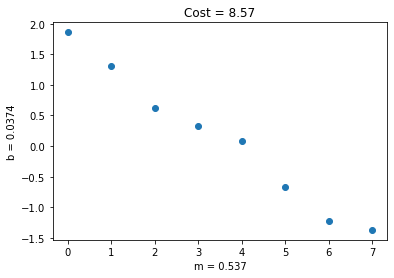

In [47]:
labeled_regression_plot(xs,ys,M,B,C,include_grad=False)

Backpropagation

![](2022-09-20-13-04-34.png)

Higher-Order Partial Derivatives

![](2022-09-20-13-07-46.png)

### INTEGRALS

Binary Classification

![](2022-09-20-13-22-10.png)

![](2022-09-20-13-25-43.png)

In [ ]:
#Receiver Operating Charateristic Area Under Curve -  ROC AUC metric

![](2022-09-20-13-55-43.png)

Numeric Integration with Python


In [1]:
from scipy.integrate import quad #  quadrature

![](2022-09-27-13-16-47.png)

In [2]:
def g(x):
    return x/2

quad(g,1,2)

(0.75, 8.326672684688674e-15)

In [4]:
def i(x):
    return 2*x

quad(i,3,4)

(7.0, 7.771561172376096e-14)

Area under ROC Curve

In [5]:
from sklearn.metrics import auc

xs = [0,0,0.5,0.5,1]
ys = [0,0.5,0.5,1,1]

auc(xs,ys)

0.75

In [1]:
from math import factorial

def coinflip_prob(n,k):
    n_choose_k = factorial(n) / (factorial(k) * factorial(n-k))
    return n_choose_k / 2 ** n

In [2]:
[coinflip_prob(5,h)for h in range(6)]

[0.03125, 0.15625, 0.3125, 0.3125, 0.15625, 0.03125]

: 